## Songs classification by genre 

#### Let's import our libraries for futher work

In [18]:
import pandas as pd
import numpy as np
import librosa
import sklearn
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV, validation_curve, RandomizedSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn import ensemble, tree
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
import tensorflow
import librosa.display
from tensorflow.keras import Input
import os
from PIL import Image
from pathlib import Path
import csv


from sklearn.metrics import accuracy_score

import plotly.express as px
import plotly.graph_objs as go
import plotly.subplots as subplots


import wandb
from wandb.sklearn import plot_precision_recall, plot_feature_importances, plot_summary_metrics
from wandb.sklearn import plot_class_proportions, plot_learning_curve, plot_roc

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline 

#### load and pre-processing our data 

In [79]:
songname = f'genres/blues/blues.00000.au'
y, sr = librosa.load(songname, mono=True, duration=2, offset=0)
ps = librosa.feature.melspectrogram(y=y, sr=sr, hop_length = 256, n_fft = 512, n_mels=64)
ps = librosa.power_to_db(ps**2)
ps.shape

(64, 173)

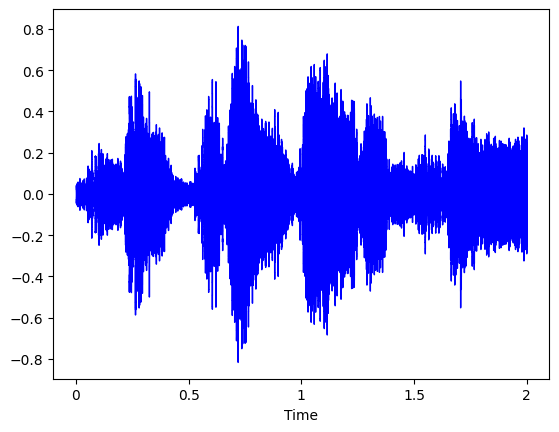

In [17]:
fig, ax = plt.subplots(nrows=1, sharex=True, sharey=True)
librosa.display.waveshow(y, sr=sr, color = 'blue')

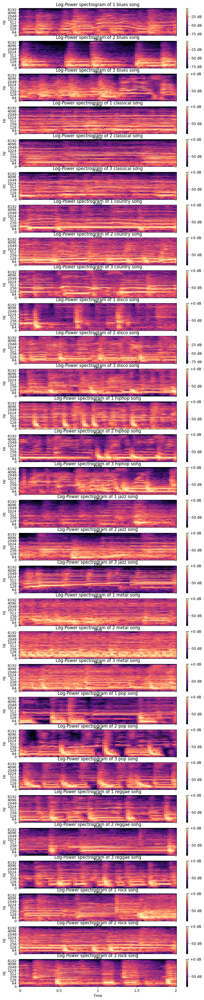

In [4]:
# Выбираем по 3 первые песни из каждого жанра, используем их спектограмму для кратковременное преобразование Фурье, чтобы визуально оценить особенности различных музыкальных жанров
dataset = []
# Создаем словарь классов, где ключи - название жанров музыки, а значения - цифры от 0 до 9
genres = {'blues': 0, 'classical': 1, 'country': 2, 'disco': 3, 'hiphop': 4,
        'jazz': 5, 'metal': 6, 'pop': 7, 'reggae': 8, 'rock': 9}

fig, ax = plt.subplots(nrows=len(genres)*3, sharex=True, sharey=True, figsize=(10,50))
counter = 0
for genre, genre_number in genres.items():
  for filename in os.listdir(f'genres/{genre}')[:3]:
    songname = f'genres/{genre}/{filename}'

    # С помощью библиотеки librosa загружаем наши песни в цикле, достаем фичи из спекторгаммы и по ним строим кратковременное преобразование Фурье (STFT)
    y, sr = librosa.load(songname, mono=True, duration=2, offset=0)
    ps = librosa.feature.melspectrogram(y=y, sr=sr, hop_length = 256, n_fft = 512, n_mels=128)
    ps = librosa.power_to_db(ps**2)
    S = np.abs(librosa.stft(y))
    # Переводим STFT в dB из power, таким образом определяя, какие частоты наиболее выделялись в определенный промежуток времени
    imgdb = librosa.display.specshow(librosa.power_to_db(S**2, ref=np.max),
                                  sr=sr, y_axis='log', x_axis='time', ax=ax[counter])
    ax[counter].set(title=f'Log-Power spectrogram of {counter % 3 + 1} {genre} song')
    fig.colorbar(imgdb, ax=ax[counter], format="%+2.0f dB")
    counter+=1
    ps.shape

    Как мы можем заметить из изображений выше, у нас появляются определенные корреляции между разложением ряда Фурье и типом музыки. Так, у классической музыки, частоты распределены равномерно, то есть нет резких скачков определенной частоты. У метала, например, очень нагруженная спектограмма, так как в песнях подробного жанра в одно время играет множество гитар, которые покрывают сразу все диапазоны частот. Также у хип-хопа можем видеть точечные всплески низких частот, так как в данном жанре преобладают ударные.

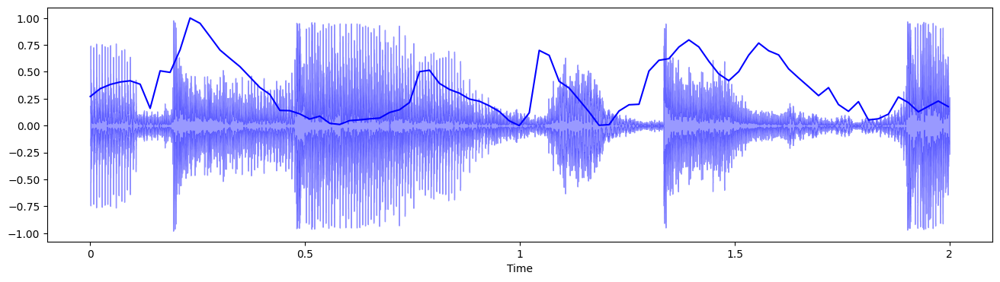

In [5]:
# построим спектральный центроид, чтобы понять, на какой частоте сосредоточена энергия спектра или, другими словами, найти, где расположен «центр масс» для звукаи с помощью функции spectral_centroid()
spectral_centroids = librosa.feature.spectral_centroid(y = y, sr = sr)[0]
plt.figure(figsize = (16, 4))
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
def normalize(y, axis = 0):
  return sklearn.preprocessing.minmax_scale(y, axis = axis)

librosa.display.waveshow(y, sr = sr, alpha = 0.4, color = 'b')
plt.plot(t, normalize(spectral_centroids), color = 'b')

    Как можно увидеть, у данного фрагмента звуковой дорожки центроид большую часть времени находится у медианного значения. Также виден рост на 0.5 - 0.75 секундах

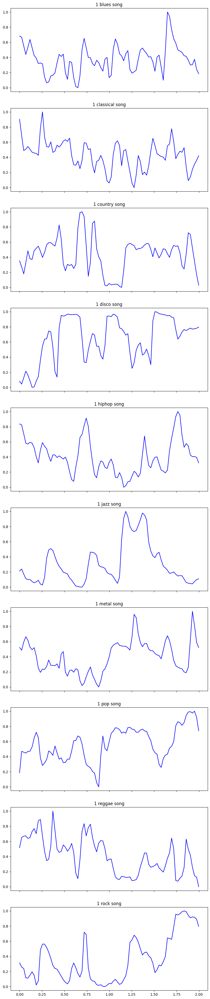

In [6]:
# Здесь мы построим спектральный центроид, чтобы понять, на какой частоте сосредоточена энергия спектра или, другими словами, найдем, где расположен «центр масс» для звука с помощью функции spectral_centroid() для оставшихся жанров музыки
genres = {'blues': 0, 'classical': 1, 'country': 2, 'disco': 3, 'hiphop': 4,
        'jazz': 5, 'metal': 6, 'pop': 7, 'reggae': 8, 'rock': 9}

fig, ax = plt.subplots(nrows=len(genres), sharex=True, sharey=True, figsize=(10,50))
counter = 0

for genre, genre_number in genres.items():
  for filename in os.listdir(f'genres/{genre}')[:1]:
    songname = f'genres/{genre}/{filename}'
    y, sr = librosa.load(songname, mono=True, duration=2, offset=0)
    ps = librosa.feature.melspectrogram(y=y, sr=sr, hop_length = 256, n_fft = 512, n_mels=128)
    ps = librosa.power_to_db(ps**2)
    spectral_centroids = librosa.feature.spectral_centroid(y = y, sr = sr,)[0]
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)
    def normalize(y, axis = 0):
      return sklearn.preprocessing.minmax_scale(y, axis = axis)

    ax[counter].set(title=f'{counter % 1 + 1} {genre} song')
    ax[counter].plot(t, normalize(spectral_centroids), color = 'b')

    counter+=1

    Как можно заметить, у металла идут резкие скачки, так как в данном жанре активно задействуется весь спектр частот

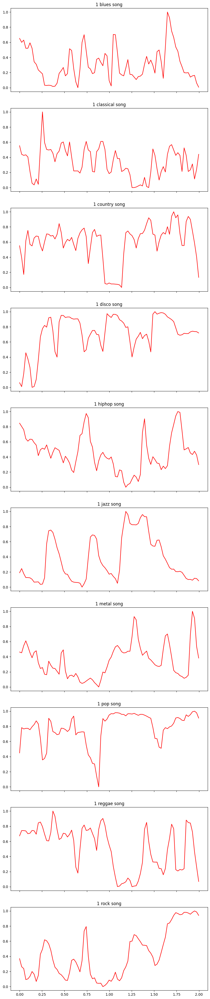

In [7]:
# Здесь мы находим спектральный спад дял каждой из дорожек ращличных жанров
# То есть меру формы сигнала, представляющая собой частоту, в которой высокие частоты снижаются до 0. Чтобы получить ее, нужно рассчитать долю элементов в спектре мощности, где 85% ее мощности находится на более низких частотах.
genres = {'blues': 0, 'classical': 1, 'country': 2, 'disco': 3, 'hiphop': 4,
        'jazz': 5, 'metal': 6, 'pop': 7, 'reggae': 8, 'rock': 9}

fig, ax = plt.subplots(nrows=len(genres), sharex=True, sharey=True, figsize=(10,50))
counter = 0

for genre, genre_number in genres.items():
  for filename in os.listdir(f'genres/{genre}')[:1]:
    songname = f'genres/{genre}/{filename}'
    y, sr = librosa.load(songname, mono=True, duration=2, offset=0)
    ps = librosa.feature.melspectrogram(y=y, sr=sr, hop_length = 256, n_fft = 512, n_mels=128)
    ps = librosa.power_to_db(ps**2)
    spectral_rolloff = librosa.feature.spectral_rolloff(y=y+0.01, sr=sr)[0]
    frames = range(len(spectral_rolloff))
    t = librosa.frames_to_time(frames)
    def normalize(y, axis = 0):
      return sklearn.preprocessing.minmax_scale(y, axis = axis)

    ax[counter].set(title=f'{counter % 1 + 1} {genre} song')
    ax[counter].plot(t, normalize(spectral_rolloff), color = 'r')

    counter+=1

    Как можно увидеть, больше всего наблюдается скачков у метала, так как скрим исполнителя - высокие частоты, а бас-гитара - низкие

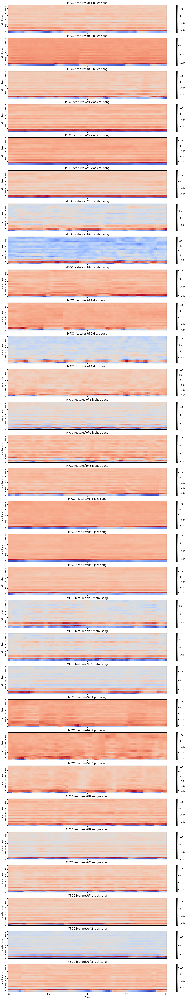

In [8]:
# Тут мы находим Мел-частотные кепстральные коэффициенты (MFCC), которые представляют собой небольшой набор признаков (обычно около 10–20), которые кратко описывают общую форму спектральной огибающей. Они моделируют характеристики человеческого голоса
dataset = []
genres = {'blues': 0, 'classical': 1, 'country': 2, 'disco': 3, 'hiphop': 4,
        'jazz': 5, 'metal': 6, 'pop': 7, 'reggae': 8, 'rock': 9}

fig, ax = plt.subplots(nrows=len(genres)*3, sharex=True, sharey=True, figsize=(16,80))
counter = 0
for genre, genre_number in genres.items():
  for filename in os.listdir(f'genres/{genre}')[:3]:
    songname = f'genres/{genre}/{filename}'
    y, sr = librosa.load(songname, mono=True, duration=2, offset=0)
    mfcc = librosa.feature.mfcc(y=y, sr=sr)
    img = librosa.display.specshow(mfcc, y_axis='chroma', x_axis='time', ax=ax[counter])
    ax[counter].set(title=f'MFCC features of {counter % 3 + 1} {genre} song')
    fig.colorbar(img, ax=ax[counter])
    counter+=1

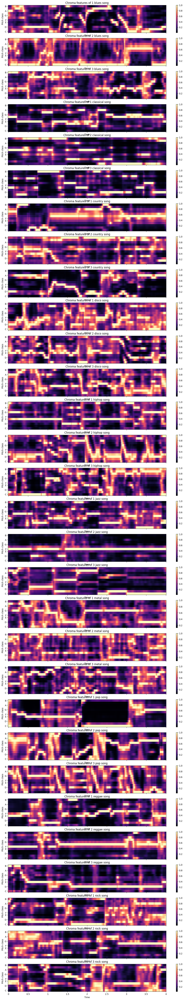

In [46]:
#Цветность

#Признак или вектор цветности обычно представлен вектором признаков из 12 элементов, в котором указано количество энергии каждого высотного класса {C, C# D, D # E, …, B} в сигнале. Используется для описания меры сходства между музыкальными произведениями.
dataset = []
genres = {'blues': 0, 'classical': 1, 'country': 2, 'disco': 3, 'hiphop': 4,
        'jazz': 5, 'metal': 6, 'pop': 7, 'reggae': 8, 'rock': 9}

fig, ax = plt.subplots(nrows=len(genres)*3, sharex=True, sharey=True, figsize=(16,80))
counter = 0
for genre, genre_number in genres.items():
  for filename in os.listdir(f'genres/{genre}')[:3]:
    songname = f'genres/{genre}/{filename}'
    y, sr = librosa.load(songname, mono=True, duration=2, offset=0)
    ch_stft = librosa.feature.chroma_stft(y=y, sr=sr, hop_length = 256)
    img = librosa.display.specshow(ch_stft, y_axis='chroma', x_axis='time', ax=ax[counter])
    ax[counter].set(title=f'Chroma features of {counter % 3 + 1} {genre} song')
    fig.colorbar(img, ax=ax[counter])
    counter+=1

In [6]:
# Вытаскиваем из песен основные фичи (мел-частотные кепстральные коэффициенты (MFCC), хромограммы и спектрограммы), создаем dataframe, где в качестве столбиков будут значения фичений
for genre, genre_number in genres.items():

      for filename in os.listdir(f'genres/{genre}'):
        songname = f'genres/{genre}/{filename}'

        y, sr = librosa.load(songname, mono=True, duration=2,sr=None)

        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)

        rms = librosa.feature.rms(y=y)

        spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr)

        spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)

        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)

        zcr = librosa.feature.zero_crossing_rate(y)

        mfcc = librosa.feature.mfcc(y=y, sr=sr, n_mfcc = 20)

        tempo = float(librosa.beat.tempo(y=y, sr=sr)[0])

        to_append = f' {tempo} {np.mean(chroma_stft)} {np.mean(rms)} {np.mean(spec_cent)} {np.mean(spec_bw)} {np.mean(rolloff)} {np.mean(zcr)}'
        for e in mfcc:
            to_append += f' {np.mean(e)}'
        to_append += f' {genre}'
# Записываем полученные данные в data.csv
        file = open('data.csv', 'a', newline='')
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

In [7]:
# Смотрим на данные и избавляемся от нулевых значений
data = pd.read_csv('data.csv')
data = data.set_axis(['tempo', 'chroma_stft', 'rms', 'spec_cent', 'spec_bw', 'rolloff', 'zcr', 'mfcc_0', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11', 'mfcc_12', 'mfcc_13', 'mfcc_14', 'mfcc_15', 'mfcc_16', 'mfcc_17', 'mfcc_18', 'mfcc_19', 'genres'],  axis='columns')

In [8]:
data

,tempo,chroma_stft,rms,spec_cent,spec_bw,rolloff,zcr,mfcc_0,mfcc_1,mfcc_2,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,genres
0,103.359375,0.457332,0.073809,1074.649163,1862.239306,2463.819201,0.023404,-308.544861,123.749733,24.979223,...,9.324069,2.831427,3.363187,-3.350072,0.564842,1.997860,1.383213,-0.216766,1.553963,blues
1,161.499023,0.388977,0.150939,1729.427461,1750.582987,3257.453866,0.090467,-110.480995,130.232834,-31.878948,...,5.562221,-9.221704,-3.155392,-9.670362,2.860130,-7.359724,-0.280319,-4.469513,-5.192780,blues
2,184.570312,0.393511,0.149810,830.667449,1360.143187,1582.071659,0.020704,-225.763611,163.039536,7.432815,...,4.487966,-2.549579,-0.999128,-2.304103,1.516250,1.196474,2.154114,0.004822,-4.772750,blues
3,135.999178,0.310987,0.071853,1535.636150,1584.171355,2884.211678,0.083816,-190.395111,148.843979,-39.583321,...,0.704057,-14.798617,-5.819794,-11.875339,-3.420751,-4.721406,2.228260,-9.991331,-11.853442,blues
4,103.359375,0.336030,0.075800,1266.349076,1580.497952,2700.931944,0.050972,-230.112198,155.809814,-16.572346,...,-3.218191,-9.094151,-3.908134,-8.681210,-6.329751,0.124771,-4.514748,-4.581883,-6.044469,blues
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,103.359375,0.327605,0.062126,1691.389893,1981.299750,3699.874562,0.060592,-218.810181,112.657494,-18.206182,...,6.969844,-8.325866,3.026398,-10.289131,-8.636410,-20.688070,3.854567,-3.742600,-4.082687,rock
995,117.453835,0.434226,0.046048,1991.681236,2103.781183,4270.751953,0.077901,-202.281052,112.609451,-30.136982,...,14.216958,-19.019228,6.224777,-1.838992,5.397192,-10.991677,-0.892053,-8.069948,-4.614259,rock
996,129.199219,0.339616,0.061805,1517.998083,1779.866353,3152.262931,0.062124,-201.578369,136.449371,-32.051594,...,2.059596,-15.963120,1.193426,-3.009887,-2.751579,-9.114152,-2.603140,-18.584003,2.191378,rock
997,135.999178,0.326378,0.085268,1178.331497,1809.359015,2681.131297,0.029488,-231.023285,129.217468,-1.310477,...,6.985904,-9.290804,1.195508,-5.650699,-1.788595,-2.772166,4.867480,-3.268232,-5.592129,rock


In [9]:
# Считываем все типы жанров, делаем разметку данных на тестовые и тренировочные
genre_list = data.iloc[:, -1]
encoder = LabelEncoder()
y = encoder.fit_transform(genre_list)
print(np.unique(y))
scaler = StandardScaler()
X=np.array(data.iloc[:, :-1])
test_size=0.2
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size,random_state=42)
X_train = scaler.fit_transform(np.array(X_train, dtype = float))
X_test = scaler.transform(np.array(X_test, dtype = float))

[0 1 2 3 4 5 6 7 8 9]


## Metrics part

#### Let's train 5 metric models and choose the best

In [10]:
wandb.login()

wandb: Currently logged in as: te200228. Use `wandb login --relogin` to force relogin


True

In [11]:
svcClf = SVC()
svcClf.fit(X_train, y_train)
svc_params = svcClf.get_params()
run = wandb.init(project="Songs_classification", name ="SVC", config=svc_params)

run.config.update(
    {
        "test_size": test_size,
        "train_len": len(X_train),
        "test_len": len(X_test),
    }
)

# log additional visualisations to wandb
plot_class_proportions(y_train, y_test, data['genres'].unique())
plot_learning_curve(svcClf, X_train, y_train)
plot_summary_metrics(svcClf, X_train, y_train, X_test, y_test)


run.finish()

In [12]:
forestClf = ensemble.RandomForestClassifier()
forestClf.fit(X_train, y_train)
foresctClf_y_probas = forestClf.predict_proba(X_test)
foresctClf_importances = forestClf.feature_importances_
foresctClf_indices = np.argsort(foresctClf_importances)[::-1]

forestClf_params = forestClf.get_params()
run = wandb.init(project="Songs_classification", name="RandomForestClassifier", config=forestClf_params)

run.config.update(
    {
        "test_size": test_size,
        "train_len": len(X_train),
        "test_len": len(X_test),
    }
)

# log additional visualisations to wandb
plot_class_proportions(y_train, y_test, data['genres'].unique())
plot_learning_curve(forestClf, X_train, y_train)
plot_summary_metrics(forestClf, X_train, y_train, X_test, y_test)
plot_feature_importances(forestClf)

run.finish()

In [13]:
nbClf = GaussianNB()
nbClf.fit(X_train, y_train)
nbClf_params = nbClf.get_params()
run = wandb.init(project="Songs_classification", name ="GaussianNB", config=nbClf_params)

run.config.update(
    {
        "test_size": test_size,
        "train_len": len(X_train),
        "test_len": len(X_test),
    }
)

# log additional visualisations to wandb
plot_class_proportions(y_train, y_test, data['genres'].unique())
plot_learning_curve(nbClf, X_train, y_train)
plot_summary_metrics(nbClf, X_train, y_train, X_test, y_test)


run.finish()

In [14]:
knnClf = KNeighborsClassifier()
knnClf.fit(X_train, y_train)
knnClf_params = knnClf.get_params()
run = wandb.init(project="Songs_classification", name ="KNeighborsClassifier", config=knnClf_params)

run.config.update(
    {
        "test_size": test_size,
        "train_len": len(X_train),
        "test_len": len(X_test),
    }
)

# log additional visualisations to wandb
plot_class_proportions(y_train, y_test, data['genres'].unique())
plot_learning_curve(knnClf, X_train, y_train)
plot_summary_metrics(knnClf, X_train, y_train, X_test, y_test)


run.finish()

In [15]:
treeClf = tree.DecisionTreeClassifier()
treeClf.fit(X_train, y_train)
treeClf_y_probas = treeClf.predict_proba(X_test)
treeClf_importances = treeClf.feature_importances_
treeClf_indices = np.argsort(treeClf_importances)[::-1]
treeClf_params = treeClf.get_params()

run = wandb.init(project="Songs_classification", name="RandomForestClassifier", config=treeClf_params)

run.config.update(
    {
        "test_size": test_size,
        "train_len": len(X_train),
        "test_len": len(X_test),
    }
)

# log additional visualisations to wandb
plot_class_proportions(y_train, y_test, data['genres'].unique())
plot_learning_curve(treeClf, X_train, y_train)
plot_summary_metrics(treeClf, X_train, y_train, X_test, y_test)
plot_feature_importances(treeClf)

run.finish()

In [16]:
models = [svcClf, forestClf, nbClf, knnClf, treeClf]

# Initialize lists to store model names and accuracy scores
model_names = []
accuracy_scores = []

# Print accuracy scores and store model names and accuracy scores
print("Accuracy score is:")
for model in models:
    pred = model.predict((X_test))
    model_accuracy = accuracy_score(y_test, pred)
    accuracy_scores.append(model_accuracy)
    model_names.append(type(model).__name__)
    print(f'| {type(model).__name__:22} | {model_accuracy:.3f} |')

# Round accuracy scores to 3 decimal places
accuracy_scores_rounded = [round(score, 3) for score in accuracy_scores]

# Create a bar plot using Plotly
fig = go.Figure(data=[go.Bar(x=model_names, y=accuracy_scores, text=accuracy_scores_rounded, textposition="auto")])

# Update layout for better visualization
fig.update_layout(title="Accuracy Score of Models",
                  xaxis_title="Model",
                  yaxis_title="Accuracy",
                  width=1000,
                  height=500)


# Show the plot
fig.show("notebook")

Accuracy score is:
| SVC                    | 0.570 |
| RandomForestClassifier | 0.480 |
| GaussianNB             | 0.340 |
| KNeighborsClassifier   | 0.500 |
| DecisionTreeClassifier | 0.420 |


#### As we can see the best accuracy have  RandomForestClassifier and DecisionTreeClassifier

### Let's tune our models

In [29]:
forest_classifier = ensemble.RandomForestClassifier(random_state=42)

In [56]:
param_grid = { 
    'n_estimators': [200, 300, 500],
    # 'max_features': ['auto', 'sqrt', 'log2'],
    'max_features': [None, 'sqrt', 'log2', 1, 0.5],  # Updated max_features values
    'max_depth' : [4, 5, 6 ,7 ,8, 9, 10],
    'criterion' :['gini', 'entropy']
}

In [59]:
clf = GridSearchCV(estimator=forest_classifier,
                   param_grid=param_grid,
                   cv=3)

In [60]:
clf.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [4, 5, 6, 7, 8, 9, 10],
                         'max_features': [None, 'sqrt', 'log2', 1, 0.5],
                         'n_estimators': [200, 300, 500]})

In [61]:
clf.best_params_

{'criterion': 'entropy',
 'max_depth': 10,
 'max_features': 'sqrt',
 'n_estimators': 500}

In [17]:
random_forest_model = ensemble.RandomForestClassifier(criterion = 'entropy',
                                                    max_depth = 10,
                                                    max_features = 'sqrt',
                                                    n_estimators = 500,
                                                    random_state=42)

In [18]:
random_forest_model.fit(X_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=10, n_estimators=500,
                       random_state=42)

In [19]:
predictions = random_forest_model.predict(X_test)

In [20]:
from sklearn.metrics import classification_report
from sklearn.metrics import ConfusionMatrixDisplay

report = classification_report(y_test, predictions)
print(report)

              precision    recall  f1-score   support

           0       0.52      0.67      0.58        21
           1       0.52      1.00      0.69        11
           2       0.33      0.17      0.22        24
           3       0.33      0.30      0.32        23
           4       0.54      0.47      0.50        15
           5       0.67      0.52      0.58        27
           6       0.55      0.61      0.58        18
           7       0.56      0.79      0.65        19
           8       0.52      0.64      0.57        22
           9       0.55      0.30      0.39        20

    accuracy                           0.52       200
   macro avg       0.51      0.55      0.51       200
weighted avg       0.51      0.52      0.49       200



In [21]:
model_accuracy = accuracy_score(y_test, predictions)
model_accuracy

0.515

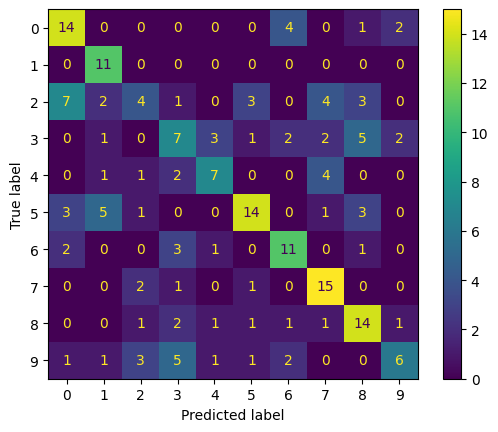

In [22]:
ConfusionMatrixDisplay.from_predictions(y_test, predictions)

In [36]:
feature_names = data.columns.values[:-1]
importances = random_forest_model.feature_importances_
std = np.std([tree.feature_importances_ for tree in random_forest_model.estimators_], axis=0)

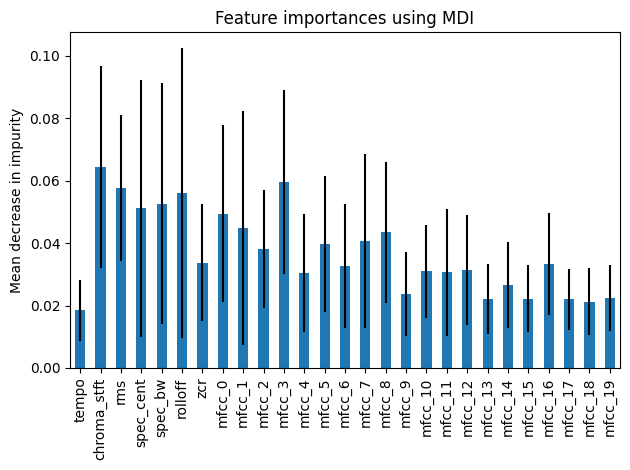

In [37]:
forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

In [38]:
from sklearn.inspection import permutation_importance

In [39]:
result = permutation_importance(
   random_forest_model, X_train, y_train, n_repeats=10, random_state=42
)

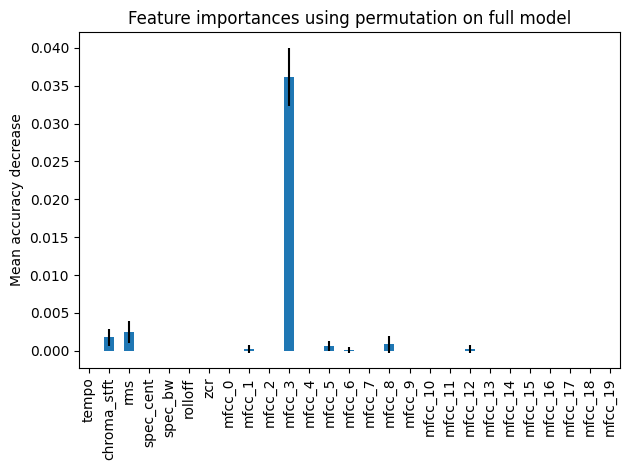

In [40]:
forest_importances = pd.Series(result.importances_mean, index=feature_names)
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

### Let's improve our tree classifier

In [41]:
tree_classifier = tree.DecisionTreeClassifier(random_state=42)

In [79]:
param_grid_tree = { 'criterion':['gini','entropy'],
              'max_depth': np.arange(3, 15)
             }

In [80]:
clf_tree = GridSearchCV(estimator=tree_classifier,
                   param_grid=param_grid_tree,
                   cv=3)

In [81]:
clf_tree.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(random_state=42),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])})

In [84]:
clf_tree.best_params_

{'criterion': 'entropy', 'max_depth': 14}

In [42]:
tree_model = tree.DecisionTreeClassifier(criterion = 'entropy',
                                                    max_depth = 14,
                                                    random_state=42)

In [43]:
tree_model.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=14, random_state=42)

In [44]:
predictions = tree_model.predict(X_test)

In [45]:
model_accuracy = accuracy_score(y_test, predictions)
model_accuracy

0.385

In [46]:
from sklearn.metrics import classification_report
from sklearn.metrics import ConfusionMatrixDisplay

report = classification_report(y_test, predictions)
print(report)

              precision    recall  f1-score   support

           0       0.47      0.43      0.45        21
           1       0.33      0.73      0.46        11
           2       0.23      0.25      0.24        24
           3       0.29      0.22      0.25        23
           4       0.26      0.40      0.32        15
           5       0.57      0.30      0.39        27
           6       0.56      0.50      0.53        18
           7       0.50      0.53      0.51        19
           8       0.50      0.45      0.48        22
           9       0.29      0.30      0.29        20

    accuracy                           0.38       200
   macro avg       0.40      0.41      0.39       200
weighted avg       0.41      0.39      0.38       200



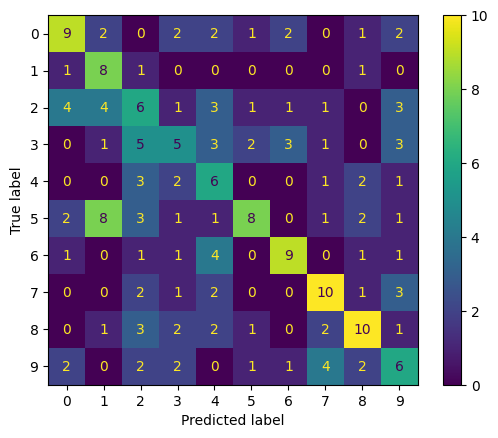

In [47]:
ConfusionMatrixDisplay.from_predictions(y_test, predictions)

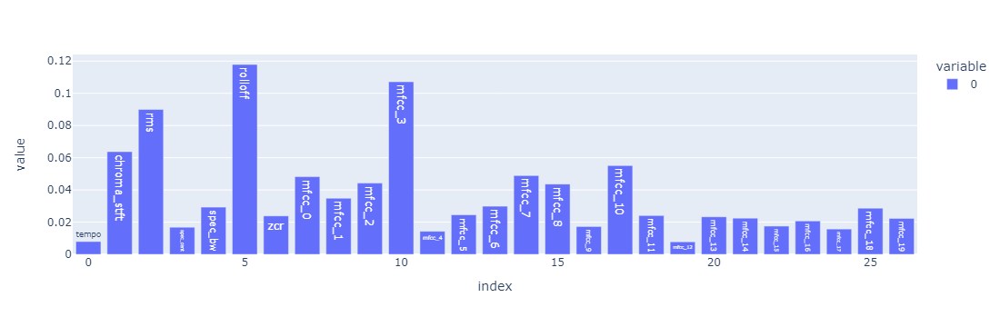

In [48]:
px.bar(tree_model.feature_importances_, text = feature_names)

## CNN part

In [47]:
# Формируем датасет
dataset = []
for genre, genre_number in genres.items():
    for filename in os.listdir(f'genres/{genre}'):
        songname = f'genres/{genre}/{filename}'
        for index in range(14):
            y, sr = librosa.load(songname, mono=True, duration=2, offset=index*2)
            ps = librosa.feature.melspectrogram(y=y, sr=sr, hop_length = 256, n_fft = 512, n_mels=64)
            ps = librosa.power_to_db(ps**2)
            dataset.append((ps, genre_number))

In [48]:
import random
# Перемешиваем данные, чтобы создать более объективную среду обучения, таким образом повысив точность модели
random.shuffle(dataset)

train_data = dataset[:8000]
valid_data = dataset[8000:10000]
test_data = dataset[10000:]

X_train, Y_train = zip(*train_data)
X_valid, Y_valid = zip(*valid_data)
X_test, Y_test = zip(*test_data)

# Решейпаем наши данные для CNN обучения
X_train = np.array([x.reshape( (64, 173, 1) ) for x in X_train])
X_valid = np.array([x.reshape( (64, 173, 1) ) for x in X_valid])
X_test = np.array([x.reshape( (64, 173, 1) ) for x in X_test])

# Энкодим наших учителей в категориальные признаки с помощью one-hot
Y_train = np.array(tensorflow.keras.utils.to_categorical(Y_train, 10))
Y_valid = np.array(tensorflow.keras.utils.to_categorical(Y_valid, 10))
Y_test = np.array(tensorflow.keras.utils.to_categorical(Y_test, 10))

In [49]:
X_train[0]

array([[[ -8.175899 ],
        [  7.571482 ],
        [  1.2400312],
        ...,
        [-24.30026  ],
        [-23.753584 ],
        [-19.729557 ]],

       [[  1.9487249],
        [ 16.051231 ],
        [ 12.492467 ],
        ...,
        [-20.299547 ],
        [-20.684097 ],
        [-29.171774 ]],

       [[  4.9045057],
        [ 10.425045 ],
        [  8.652241 ],
        ...,
        [-17.51929  ],
        [-20.723906 ],
        [-35.405476 ]],

       ...,

       [[-42.128487 ],
        [-42.128487 ],
        [-42.128487 ],
        ...,
        [-42.128487 ],
        [-42.128487 ],
        [-42.128487 ]],

       [[-42.128487 ],
        [-42.128487 ],
        [-42.128487 ],
        ...,
        [-42.128487 ],
        [-42.128487 ],
        [-42.128487 ]],

       [[-42.128487 ],
        [-42.128487 ],
        [-42.128487 ],
        ...,
        [-42.128487 ],
        [-42.128487 ],
        [-42.128487 ]]], dtype=float32)

#### Let's import our libraries for CV

In [20]:
# Импортируем библиотеки для глубинного обучения
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Lambda
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import AveragePooling2D
import keras

from wandb.keras import WandbMetricsLogger, WandbModelCheckpoint

### Create custom model for music classification with Keras

In [21]:
inputs = keras.Input(shape=(64, 173, 1))
x = layers.Conv2D(32, 3, activation="relu")(inputs) # слой светки
x = layers.Conv2D(64, 3, activation="relu")(x) # слой светки
block_1_output = layers.MaxPooling2D(3)(x) # уменьшаем размерность(качество) нашей картинки, чтобы упростить обработку

x = layers.Conv2D(64, 3, activation="relu", padding = "same")(block_1_output) # подключаем два предыдущих слоя к текущему слою свертки, чтобы увечилить точность и избежать случая, когда функция обратного распространения ошибки не дойдет до конца
x = layers.Conv2D(64, 3, activation="relu", padding = "same")(x)

# Последующие слои проектируем аналогично предыдущим

block_2_output = layers.add([x, block_1_output])

x = layers.Conv2D(64, 3, activation="relu", padding = "same")(block_2_output)
x = layers.Conv2D(64, 3, activation="relu", padding = "same")(x)

block_3_output = layers.add([x, block_2_output])

x = layers.Conv2D(64, 3, activation="relu",  padding = "same")(block_3_output)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(256, activation = "relu")(x)
# Дропаем, то есть отключаем половину рандомных нейронов из полсносвязной сети, чтобы избежать переобучения
x = layers.Dropout(0.5)(x)
# Последний словй служит для классификация по 10 видам
outputs = layers.Dense(10, activation = 'softmax')(x)

In [49]:
from keras import metrics
from keras.callbacks import EarlyStopping

NUM_EPOCHS = 100
BATCH_SIZE = 32

### Train and validate our model

In [135]:
wandb.init(project='cv-songs-classification')

In [ ]:
# обучаем модель за 100 эпох

model = keras.Model(inputs, outputs, name = "Resnet")

model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
total = model.fit(X_train, Y_train, batch_size = BATCH_SIZE, epochs = NUM_EPOCHS, validation_split = 0.2, callbacks=[es, WandbMetricsLogger(),
       ])

Epoch 1/100
200/200 ━━━━━━━━━━━━━━━━━━━━ 24:29 7s/step - accuracy: 0.0938 - loss: 5.98 ━━━━━━━━━━━━━━━━━━━━ 8:13 2s/step - accuracy: 0.1016 - loss: 5.6220 ━━━━━━━━━━━━━━━━━━━━ 8:08 2s/step - accuracy: 0.0955 - loss: 5.320 ━━━━━━━━━━━━━━━━━━━━ 8:18 3s/step - accuracy: 0.0911 - loss: 5.041 ━━━━━━━━━━━━━━━━━━━━ 8:37 3s/step - accuracy: 0.0879 - loss: 4.810 ━━━━━━━━━━━━━━━━━━━━ 8:48 3s/step - accuracy: 0.0845 - loss: 4.617 ━━━━━━━━━━━━━━━━━━━━ 8:42 3s/step - accuracy: 0.0846 - loss: 4.451 ━━━━━━━━━━━━━━━━━━━━ 8:44 3s/step - accuracy: 0.0848 - loss: 4.308 ━━━━━━━━━━━━━━━━━━━━ 8:42 3s/step - accuracy: 0.0850 - loss: 4.183 ━━━━━━━━━━━━━━━━━━━━ 8:32 3s/step - accuracy: 0.0849 - loss: 4.075 ━━━━━━━━━━━━━━━━━━━━ 8:48 3s/step - accuracy: 0.0855 - loss: 3.980 ━━━━━━━━━━━━━━━━━━━━ 9:02 3s/step - accuracy: 0.0859 - loss: 3.896 ━━━━━━━━━━━━━━━━━━━━ 8:57 3s/step - accuracy: 0.0869 - loss: 3.821 ━━━━━━━━━━━━━━━━━━━━ 9:07 3s/step - accuracy: 0.0879 - loss: 3.753 ━━━━━━━━━━━━━━━━━━━━ 9:22 3s/step - accur

In [139]:
# model.save_weights('Weights/songs_classification.weights.h5')

In [22]:
test = keras.Model(inputs, outputs, name = "Resnet")

In [23]:
test.summary()

Model: "Resnet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 64, 173, 1)        │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d (Conv2D)               │ (None, 62, 171, 32)       │             320 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_1 (Conv2D)             │ (None, 60, 169, 64)       │          18,496 │ conv2d[0][0]               │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d (MaxPooling2D)  │ (None, 20, 56, 64)        │               0 │ conv2d_1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_2 (Conv2D)             │ (None, 20, 56, 64)        │          36,928 │ max_pooling2d[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_3 (Conv2D)             │ (None, 20, 56, 64)        │          36,928 │ conv2d_2[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ add (Add)                     │ (None, 20, 56, 64)        │               0 │ conv2d_3[0][0],            │
│                               │                           │                 │ max_pooling2d[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_4 (Conv2D)             │ (None, 20, 56, 64)        │          36,928 │ add[0][0]                  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_5 (Conv2D)             │ (None, 20, 56, 64)        │          36,928 │ conv2d_4[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ add_1 (Add)                   │ (None, 20, 56, 64)        │               0 │ conv2d_5[0][0], add[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_6 (Conv2D)             │ (None, 20, 56, 64)        │          36,928 │ add_1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ global_average_pooling2d      │ (None, 64)                │               0 │ conv2d_6[0][0]             │
│ (GlobalAveragePooling2D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense (Dense)                 │ (None, 256)               │          16,640 │ global_average_pooling2d[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dropout (Dropout)             │ (None, 256)               │               0 │ dense[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ dense_1 (Dense)               │ (None, 10)                │           2,570 │ dropout[0][0]              │
└───────────────────────────────┴───────────────────────────┴─────────────────┴────────────────────────────┘

 Total params: 222,666 (869.79 KB)

 Trainable params: 222,666 (869.79 KB)

 Non-trainable params: 0 (0.00 B)

In [24]:
test.load_weights('Weights/songs_classification.weights.h5')

In [54]:
w2 = test.get_weights()

125/125 ━━━━━━━━━━━━━━━━━━━━ 1:49 883ms/st ━━━━━━━━━━━━━━━━━━━━ 1:05 529ms/st ━━━━━━━━━━━━━━━━━━━━ 1:07 550ms/st ━━━━━━━━━━━━━━━━━━━━ 1:05 540ms/st ━━━━━━━━━━━━━━━━━━━━ 1:04 542ms/st ━━━━━━━━━━━━━━━━━━━━ 1:05 552ms/st ━━━━━━━━━━━━━━━━━━━━ 1:07 574ms/st ━━━━━━━━━━━━━━━━━━━━ 1:09 592ms/st ━━━━━━━━━━━━━━━━━━━━ 1:08 594ms/st ━━━━━━━━━━━━━━━━━━━━ 1:10 614ms/st ━━━━━━━━━━━━━━━━━━━━ 1:10 619ms/st ━━━━━━━━━━━━━━━━━━━━ 1:09 615ms/st ━━━━━━━━━━━━━━━━━━━━ 1:08 615ms/st ━━━━━━━━━━━━━━━━━━━━ 1:07 611ms/st ━━━━━━━━━━━━━━━━━━━━ 1:07 610ms/st ━━━━━━━━━━━━━━━━━━━━ 1:08 624ms/st ━━━━━━━━━━━━━━━━━━━━ 1:09 643ms/st ━━━━━━━━━━━━━━━━━━━━ 1:09 646ms/st ━━━━━━━━━━━━━━━━━━━━ 1:08 642ms/st ━━━━━━━━━━━━━━━━━━━━ 1:07 640ms/st ━━━━━━━━━━━━━━━━━━━━ 1:06 636ms/st ━━━━━━━━━━━━━━━━━━━━ 1:05 634ms/st ━━━━━━━━━━━━━━━━━━━━ 1:04 634ms/st ━━━━━━━━━━━━━━━━━━━━ 1:03 632ms/st ━━━━━━━━━━━━━━━━━━━━ 1:02 629ms/st ━━━━━━━━━━━━━━━━━━━━ 1:02 627ms/st ━━━━━━━━━━━━━━━━━━━━ 1:01 629ms/st ━━━━━━━━━━━━━━━━━━━━ 1:01 631ms/st ━━━━━━━━━━━━

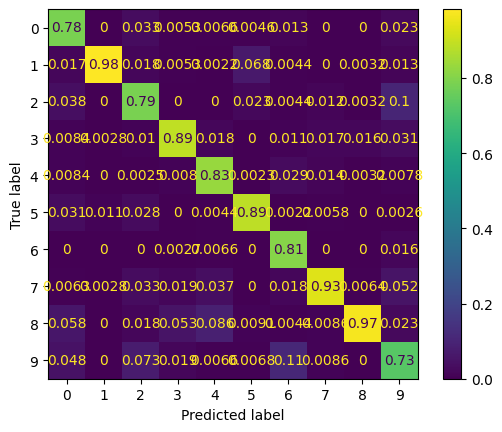

In [61]:
#Предсказываем
y_prediction = test.predict(X_test)
y_prediction = np.argmax(y_prediction, axis = 1)
y_test=np.argmax(Y_test, axis=1)
#Созадем матрицу ошибок и выводим ее значения
ConfusionMatrixDisplay.from_predictions(y_test, y_prediction , normalize='pred')

In [66]:
model_accuracy = accuracy_score(y_test, y_prediction)
model_accuracy

0.85325

In [62]:
report = classification_report(y_test, y_prediction)
print(report)

              precision    recall  f1-score   support

           0       0.78      0.91      0.84       411
           1       0.98      0.86      0.92       409
           2       0.79      0.81      0.80       385
           3       0.89      0.88      0.88       379
           4       0.83      0.92      0.88       409
           5       0.89      0.92      0.90       425
           6       0.81      0.97      0.88       375
           7       0.93      0.82      0.87       395
           8       0.97      0.73      0.83       416
           9       0.73      0.70      0.72       396

    accuracy                           0.85      4000
   macro avg       0.86      0.85      0.85      4000
weighted avg       0.86      0.85      0.85      4000



### Let's import libraries for our pretrained model MobileNet 

In [67]:
import numpy as np 
from tqdm import tqdm 
import os
# import cv2 
import shutil
import random 
import time
import matplotlib.pyplot as plt
%matplotlib inline 
import tensorflow as tf
from tensorflow import keras 
from keras import backend as K
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, GlobalAveragePooling2D  
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications import imagenet_utils 
from tensorflow. keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input 
from IPython.display import Image
from sklearn.metrics import confusion_matrix 
import itertools
import datetime 
import time

### Tune our model

In [68]:
mobile = tf.keras.applications.mobilenet.MobileNet()
base_model = MobileNet(weights = 'imagenet', include_top = False)
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(300, activation = 'relu')(x)
x = Dense(200, activation = 'relu')(x)
x = Dense(100, activation = 'relu')(x)
preds = Dense(10, activation = 'softmax')(x)

In [69]:
for layer in base_model.layers[:20]: layer.trainable=False
model=Model(inputs=base_model.input, outputs=preds)
inputs = Input(shape=(64, 173, 1))
new_model = Sequential()
new_model.add(inputs)
new_model.add(layers.Conv2D(32, 3, activation="relu"))
for layer in model.layers[2:]:
    new_model.add(layer)
new_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_7 (Conv2D)                    │ (None, 62, 171, 32)         │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_bn (BatchNormalization)        │ (None, 62, 171, 32)         │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_relu (ReLU)                    │ (None, 62, 171, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1 (DepthwiseConv2D)          │ (None, 62, 171, 32)         │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_bn (BatchNormalization)    │ (None, 62, 171, 32)         │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_relu (ReLU)                │ (None, 62, 171, 32)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1 (Conv2D)                   │ (None, 62, 171, 64)         │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_bn (BatchNormalization)    │ (None, 62, 171, 64)         │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_relu (ReLU)                │ (None, 62, 171, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pad_2 (ZeroPadding2D)           │ (None, 63, 172, 64)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2 (DepthwiseConv2D)          │ (None, 31, 85, 64)          │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_bn (BatchNormalization)    │ (None, 31, 85, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_relu (ReLU)                │ (None, 31, 85, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2 (Conv2D)                   │ (None, 31, 85, 128)         │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_bn (BatchNormalization)    │ (None, 31, 85, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_relu (ReLU)                │ (None, 31, 85, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3 (DepthwiseConv2D)          │ (None, 31, 85, 128)         │           1,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_bn (BatchNormalization)    │ (None, 31, 85, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_relu (ReLU)                │ (None, 31, 85, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_3 (Conv2D)                   │ (None, 31, 85, 128)         │          16,384 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_3_bn (BatchNormalization)    │ (None, 31, 85, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 3,617,130 (13.80 MB)

 Trainable params: 3,582,090 (13.66 MB)

 Non-trainable params: 35,040 (136.88 KB)

In [12]:
new_model.compile(optimizer = Adam(learning_rate = 0.0001), loss = 'categorical_crossentropy', metrics=['acc']) 

### Train and validate pretrained model

In [18]:
n_epochs = 16
run = wandb.init(project="CNN", name ="song_classification_with_cnn_MobileNet")
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=5)
wandb_callbacks = [
        WandbMetricsLogger(log_freq=10),
#         WandbClsEvalCallback(
#             testing_data,
#             data_table_columns=["idx", "image", "ground_truth"],
#             pred_table_columns=["epoch", "idx", "image", "ground_truth", "prediction"]
#         )
    es
    ]

history = new_model.fit(X_train, Y_train, batch_size = BATCH_SIZE, epochs = n_epochs, validation_split = 0.2, callbacks=[wandb_callbacks] )
       


run.finish()

Epoch 1/16


wandb: ERROR Unable to log learning rate.


200/200 ━━━━━━━━━━━━━━━━━━━━ 48:08 15s/step - acc: 0.1562 - loss: 2.44 ━━━━━━━━━━━━━━━━━━━━ 11:20 3s/step - acc: 0.1406 - loss: 2.4767 ━━━━━━━━━━━━━━━━━━━━ 11:01 3s/step - acc: 0.1458 - loss: 2.478 ━━━━━━━━━━━━━━━━━━━━ 10:53 3s/step - acc: 0.1445 - loss: 2.476 ━━━━━━━━━━━━━━━━━━━━ 10:50 3s/step - acc: 0.1456 - loss: 2.466 ━━━━━━━━━━━━━━━━━━━━ 10:48 3s/step - acc: 0.1483 - loss: 2.454 ━━━━━━━━━━━━━━━━━━━━ 10:44 3s/step - acc: 0.1526 - loss: 2.441 ━━━━━━━━━━━━━━━━━━━━ 10:49 3s/step - acc: 0.1560 - loss: 2.430 ━━━━━━━━━━━━━━━━━━━━ 10:44 3s/step - acc: 0.1595 - loss: 2.421 ━━━━━━━━━━━━━━━━━━━━ 10:40 3s/step - acc: 0.1629 - loss: 2.411 ━━━━━━━━━━━━━━━━━━━━ 10:39 3s/step - acc: 0.1664 - loss: 2.400 ━━━━━━━━━━━━━━━━━━━━ 10:47 3s/step - acc: 0.1695 - loss: 2.390 ━━━━━━━━━━━━━━━━━━━━ 10:44 3s/step - acc: 0.1720 - loss: 2.381 ━━━━━━━━━━━━━━━━━━━━ 10:40 3s/step - acc: 0.1739 - loss: 2.373 ━━━━━━━━━━━━━━━━━━━━ 10:36 3s/step - acc: 0.1761 - loss: 2.365 ━━━━━━━━━━━━━━━━━━━━ 10:35 3s/step - acc: 0.17

KeyboardInterrupt: 

In [19]:
# new_model.save_weights('Weights/songs_classification_MobileNet.weights.h5')

In [70]:
test = new_model

In [74]:
test.load_weights('Weights/songs_classification_MobileNet.weights.h5')

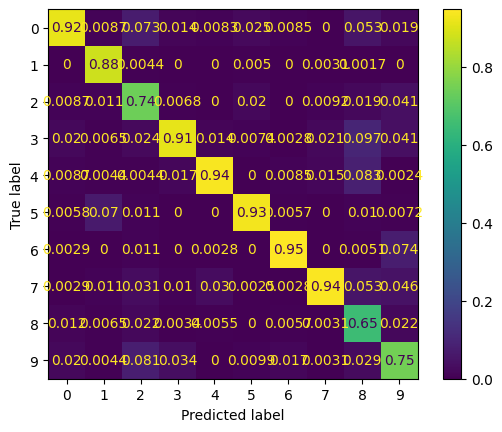

In [83]:
#Предсказываем
y_prediction = new_model.predict(X_test)
y_prediction = np.argmax(y_prediction, axis = 1)
y_test=np.argmax(Y_test, axis=1)
#Создаем матрицу ошибок и выводим ее значения
ConfusionMatrixDisplay.from_predictions(y_test, y_prediction , normalize='pred')
report = classification_report(y_test, y_prediction)

In [84]:
model_accuracy = accuracy_score(y_test, y_prediction)
model_accuracy

0.84375

In [85]:
report = classification_report(y_test, y_prediction)
print(report)

              precision    recall  f1-score   support

           0       0.92      0.77      0.84       411
           1       0.88      0.99      0.93       409
           2       0.74      0.87      0.80       385
           3       0.91      0.71      0.80       379
           4       0.94      0.83      0.88       409
           5       0.93      0.88      0.91       425
           6       0.95      0.89      0.92       375
           7       0.94      0.78      0.86       395
           8       0.65      0.92      0.76       416
           9       0.75      0.79      0.77       396

    accuracy                           0.84      4000
   macro avg       0.86      0.84      0.85      4000
weighted avg       0.86      0.84      0.85      4000



### Part of Visual transformers in google collab  https://colab.research.google.com/drive/1KrtH_Xv_e4e3wy_DRi0LIvNuDblPla38?usp=drive_link

### Mood classification in google collab  https://colab.research.google.com/drive/1pq3D2kXExSLZtFpCZCpCWdOaNm_4g45o?usp=sharing